# Исследование рынка заведений общественного питания Москвы

## Изучение датасета 

Сначала импортируем все библиотеки, которые могут потребоваться при выполнении проекта:

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
import plotly.graph_objs as go
import plotly.figure_factory as ff
import json
import folium
from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster

Загрузим и изучим датасет:

In [2]:
data = pd.read_csv('/datasets/moscow_places.csv', sep = ',')

In [3]:
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


В датасете представлена информация о 8406 заведениях общепита Москвы.

В нем имеются следующие столбцы:

1. name — название заведения (тип данных - **строковый**);
2. category — категория заведения (тип данных - **строковый**);
3. address — адрес заведения (тип данных - **строковый**);
4. district — административный район, в котором находится заведение (тип данных - **строковый**);
5. hours — информация о днях и часах работы (тип данных - **строковый**);
6. lat — широта географической точки, в которой находится заведение (тип данных - **вещественные числа**);
7. lng — долгота географической точки, в которой находится заведение (тип данных - **вещественные числа**);
8. rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (тип данных - **вещественные числа**);
9. price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее (тип данных - **строковый**);
10. avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона (тип данных - **строковый**);
11. middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт» (тип данных - **вещественные числа**):
12. middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино» (тип данных - **вещественные числа**);
13. chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (тип данных - **вещественные числа**);
14. seats — количество посадочных мест (тип данных - **вещественные числа**).

В принципе все столбцы имеют подходящие типы данных, поэтому на данном этапе с датасетом пока не будем ничего делать. Можно переходить к шагу № 2 **Предобработка данных**.

## Предобработка данных

Начнем с проверки на дубликаты:

In [5]:
data.duplicated().sum()

0

Дубликатов нет.

Изучим теперь пропуски.

In [6]:
data.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

Пропуски имеются в следующих столбцах: **hours**, **price**, **avg_bill**, **middle_avg_bill**, **middle_coffee_cup**, **seats**.

Поскольку время работы заведений и количество посадочных мест могут никак не зависеть от типа заведения, его расположения и других факторов, то в столбце **hours** пропуски устранить не получится. В столбце **seats** пропуски тоже оставим без изменений. Что касается остальных столбцов, то здесь ситуация сложнее - средние чеки очень сильно зависят от расположения заведения. Поэтому даже в рамках сетевого предприятия могут быть значительные отличия, и заменять пропущенные значения средними или медианными будет не совсем корректно. Считаю, что пропуски во всех столбцах лучше оставить.

Проверим столбцы **rating**, **middle_avg_bill**, **middle_coffee_cup** и **seats** на аномалии.

In [7]:
data['rating'].describe()

count    8406.000000
mean        4.229895
std         0.470348
min         1.000000
25%         4.100000
50%         4.300000
75%         4.400000
max         5.000000
Name: rating, dtype: float64

In [8]:
data['middle_avg_bill'].describe()

count     3149.000000
mean       958.053668
std       1009.732845
min          0.000000
25%        375.000000
50%        750.000000
75%       1250.000000
max      35000.000000
Name: middle_avg_bill, dtype: float64

In [9]:
data['middle_coffee_cup'].describe()

count     535.000000
mean      174.721495
std        88.951103
min        60.000000
25%       124.500000
50%       169.000000
75%       225.000000
max      1568.000000
Name: middle_coffee_cup, dtype: float64

In [10]:
data['seats'].describe()

count    4795.000000
mean      108.421689
std       122.833396
min         0.000000
25%        40.000000
50%        75.000000
75%       140.000000
max      1288.000000
Name: seats, dtype: float64

Во всех столбцах кроме **seats** явных аномалий нет. В столбце **seats** бросается в глаза 1288 посадочных мест - максимальное количество. Остановимся на этом столбце подробнее.

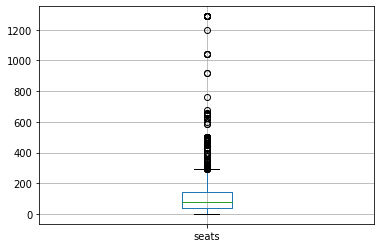

In [11]:
data.boxplot(column='seats')
plt.show()

Заведения с количеством посадочных мест свыше 400 явно являются выбросами и аномалиями (возможно, были ошибки при указании числа посадочных мест). Поэтому удалим эти заведения из датасета~~, но сначала заменим пропуски на "заглушку"~~:

In [12]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [13]:
data_clear = data.loc[(data['seats']<=400.0) | (data['seats'].isna())].reset_index(drop=True)
data_clear.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8285 entries, 0 to 8284
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8285 non-null   object 
 1   category           8285 non-null   object 
 2   address            8285 non-null   object 
 3   district           8285 non-null   object 
 4   hours              7761 non-null   object 
 5   lat                8285 non-null   float64
 6   lng                8285 non-null   float64
 7   rating             8285 non-null   float64
 8   price              3263 non-null   object 
 9   avg_bill           3755 non-null   object 
 10  middle_avg_bill    3095 non-null   float64
 11  middle_coffee_cup  528 non-null    float64
 12  chain              8285 non-null   int64  
 13  seats              4674 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 906.3+ KB


In [14]:
lost_info = round((data['name'].count() - data_clear['name'].count())/data['name'].count()*100,2)
print('Удалено', lost_info, '% информации.')

Удалено 1.44 % информации.


Это незначительно, поэтому спокойно двигаемся дальше.

Создадим отдельный столбец **street** с названиями улиц из столбца **address**.

In [15]:
keywords = ['проезд','шоссе','улица','переулок','микрорайон','мкад','проспект','пр.',
         'площадь','аллея','бульвар','набережная','сквер','тупик','линия','территория',
         'квартал','просек', 'парк','мост','поселение','округ','парк','МКАД','километр']
 
str_pat = r".*,\s*\b([^,]*?(?:{})\b[^,]*)[,$]+".format("|".join(keywords))
 
data_clear['street'] = data_clear['address'].str.extract(str_pat)

In [16]:
data_clear.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица


In [17]:
data_clear.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8285 entries, 0 to 8284
Data columns (total 15 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8285 non-null   object 
 1   category           8285 non-null   object 
 2   address            8285 non-null   object 
 3   district           8285 non-null   object 
 4   hours              7761 non-null   object 
 5   lat                8285 non-null   float64
 6   lng                8285 non-null   float64
 7   rating             8285 non-null   float64
 8   price              3263 non-null   object 
 9   avg_bill           3755 non-null   object 
 10  middle_avg_bill    3095 non-null   float64
 11  middle_coffee_cup  528 non-null    float64
 12  chain              8285 non-null   int64  
 13  seats              4674 non-null   float64
 14  street             8187 non-null   object 
dtypes: float64(6), int64(1), object(8)
memory usage: 971.0+ KB


In [18]:
data_clear.loc[data_clear['street'].isna()]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
25,В парке вкуснее,кофейня,"Москва, парк Левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,1,NaN,NaN
60,Чебуречная история,кофейня,"Москва, ландшафтный заказник Лианозовский",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.899845,37.570488,4.9,NaN,NaN,NaN,NaN,1,NaN,NaN
64,Testo мания,кофейня,"Москва, Лианозовский парк культуры и отдыха",Северо-Восточный административный округ,"ежедневно, 09:00–21:00",55.900058,37.570544,4.1,NaN,NaN,NaN,NaN,0,NaN,NaN
73,Веранда,ресторан,"Москва, парк Алтуфьево",Северо-Восточный административный округ,"пн-пт 11:00–22:00; сб,вс 11:00–23:00",55.906875,37.582493,4.2,NaN,NaN,NaN,NaN,1,NaN,NaN
137,Get and fly,ресторан,"Москва, парк Ангарские пруды",Северный административный округ,"ежедневно, 09:00–23:00",55.880350,37.530713,4.1,NaN,NaN,NaN,NaN,0,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7661,Coff Home,кафе,"Москва, Варшавское шоссе",Южный административный округ,NaN,55.609108,37.608760,4.4,NaN,NaN,NaN,NaN,0,NaN,NaN
7707,Coffeplet,кафе,"Москва, Липецкая улица (дублёр)",Южный административный округ,вт-вс 10:00–20:00,55.592881,37.672531,3.9,NaN,NaN,NaN,NaN,0,NaN,NaN
7987,Лодочная станция,кафе,"Москва, Северный ландшафтный парк",Южный административный округ,NaN,55.698434,37.671403,4.8,NaN,NaN,NaN,NaN,0,NaN,NaN
8034,Свежо Горячо,быстрое питание,"Москва, 2-й Павелецкий проезд",Южный административный округ,пн-пт 08:15–19:45,55.713292,37.644449,4.0,средние,Средний счёт:300–500 ₽,400.0,NaN,0,NaN,NaN


Новый столбец в названиями улиц добавлен, однако в нем есть 98 пропусков. Оставим их как есть - таких строк около 1 % от всего датасета.

Осталось добавить столбец **is_24/7** с обозначением, что заведение работает ежедневно и круглосуточно.

In [19]:
data_clear.loc[data_clear['hours']=='ежедневно, круглосуточно', 'is_24/7'] = True
data_clear.loc[data_clear['hours']!='ежедневно, круглосуточно', 'is_24/7'] = False

In [20]:
data_clear.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко,False
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко,False
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица,False
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,False
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица,False


Новый столбец добавлен.

**Вывод по шагу 2:**

В ходе предобработки данных была проведена проверка на наличие дубликатов (их не оказалось) и пропусков. Решено, что пропуски оставим без изменений во всех столбцах.

Также были созданы 2 дополнительных столбца: **street** - с названиями улиц, на которых расположены заведения и **is_24/7** - с разделением на круглосуточные и другие заведения.

## Исследовательский анализ данных

На данном шаге нам необходимо выполнить следующие исследования и задания:

1. Изучение категорий заведений.
2. Исследование количества посадочных мест.
3. Сравнение сетевых и несетевых заведений.
4. Какие категории заведений чаще являются сетевыми?
5. Топ-15 популярных сетей.
6. Исследование по административным районам Москвы.
7. Исследование средних рейтингов по категориям заведений.
8. Построить фоновую картограмму (хороплет) со средним рейтингом заведений каждого района.
9. Отобразить все заведения на карте с помощью кластеров.
10. Топ-15 улиц по количеству заведений.
11. Исследование улиц с единственным объектом общепита.
12. Исследование средних чеков заведений по районам.
13. Сформулировать общий вывод по данному шагу.

**3.1 Изучение категорий заведений.**

Посмотрим, какие заведения представлены в датасете:

In [21]:
data_clear['category'].unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

Всего 8 типов заведений и они все уникальны (т.е. нет необходимости объединить какие-либо категории в одну). Посмотрим, как количественно распределены заведения:

In [22]:
data_category = data_clear.groupby('category').agg({'category':'count'})
data_category = data_category.rename(columns={'category':'cnt'})
data_category['ratio'] = round((data_category['cnt']/data_category['cnt'].sum())*100,2)
data_category = data_category.sort_values(by='ratio', ascending=False)
data_category

,cnt,ratio
category,,
кафе,2348,28.34
ресторан,2004,24.19
кофейня,1394,16.83
"бар,паб",747,9.02
пиццерия,627,7.57
быстрое питание,599,7.23
столовая,312,3.77
булочная,254,3.07


Как видно из таблицы, основную долю заведений составляют кафе и рестораны - 28 и 24 процента соответственно, кофейни третьи по популярности - 16.8 %. Меньше всего столовых и булочных. Визуализируем таблицу:

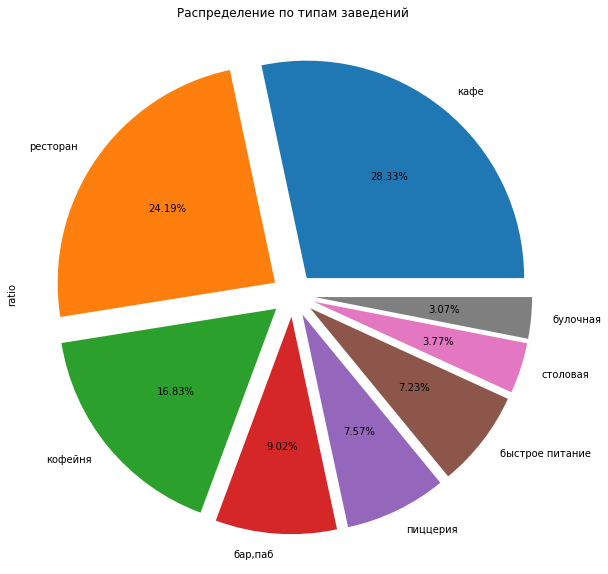

In [23]:
data_category.plot(y='ratio',
                   explode =(0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1),
                   kind='pie',
                   legend=False,
                   figsize=(20,10),
                   autopct='%1.2f%%',
                   title = 'Распределение по типам заведений')
plt.show()

**3.2 Исследование количества посадочных мест**

Для каждой категории заведений исследуем количество посадочных мест:

In [24]:
data_seats = data_clear.pivot_table(index='category', values='seats', aggfunc=('sum', 'mean', 'median'))
data_seats = data_seats.sort_values(by='sum', ascending = False).reset_index()
data_seats

,category,mean,median,sum
0,ресторан,106.914703,83.0,131612.0
1,кафе,84.236532,60.0,100073.0
2,кофейня,96.747268,75.0,70819.0
3,"бар,паб",102.748889,80.0,46237.0
4,пиццерия,86.232779,52.0,36304.0
5,быстрое питание,92.965217,64.0,32073.0
6,столовая,87.614907,75.0,14106.0
7,булочная,83.054795,49.5,12126.0


Построим столбчатые диаграммы для суммарного количества посадочных мест, среднего и медианного количества посадочных мест в зависимости от типа заведения:

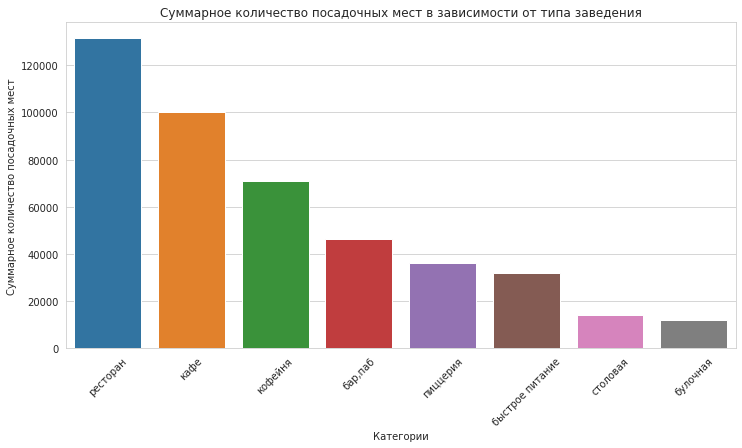

In [25]:
sns.set_style('whitegrid')
plt.figure(figsize=(12, 6))
ax = sns.barplot(x='category', y='sum', data=data_seats)
plt.xlabel('Категории')
plt.ylabel('Суммарное количество посадочных мест')
plt.title('Суммарное количество посадочных мест в зависимости от типа заведения')
ax.set_xticklabels(ax.get_xticklabels(),rotation = 45)
plt.show()

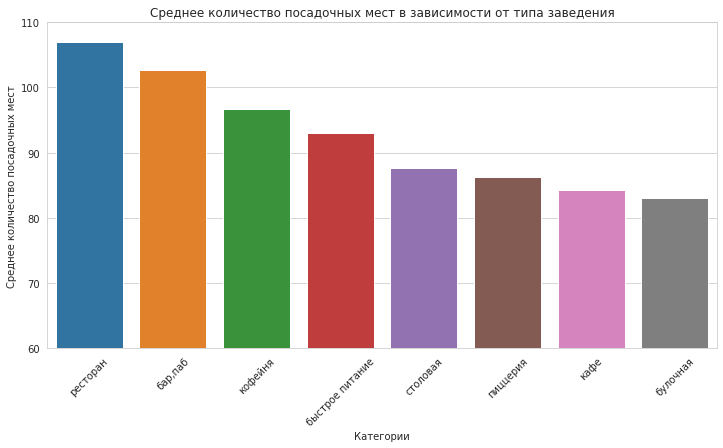

In [26]:
data_seats_mean = data_seats.sort_values(by='mean', ascending=False)
sns.set_style('whitegrid')
plt.figure(figsize=(12, 6))
ax = sns.barplot(x='category', y='mean', data=data_seats_mean)
plt.xlabel('Категории')
plt.ylabel('Среднее количество посадочных мест')
plt.ylim(60,110)
plt.title('Среднее количество посадочных мест в зависимости от типа заведения')
ax.set_xticklabels(ax.get_xticklabels(),rotation = 45)
plt.show()

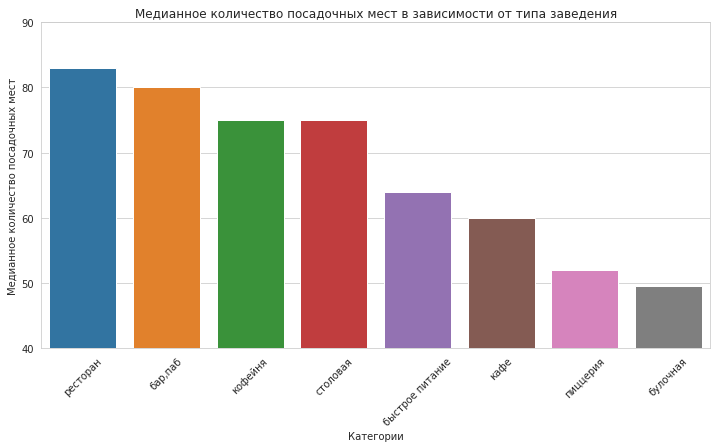

In [27]:
data_seats_median = data_seats.sort_values(by='median', ascending=False)
sns.set_style('whitegrid')
plt.figure(figsize=(12, 6))
ax = sns.barplot(x='category', y='median', data=data_seats_median)
plt.xlabel('Категории')
plt.ylabel('Медианное количество посадочных мест')
plt.ylim(40,90)
plt.title('Медианное количество посадочных мест в зависимости от типа заведения')
ax.set_xticklabels(ax.get_xticklabels(),rotation = 45)
plt.show()

Как видно из визуализаций выше, наибольшее количество посадочных мест в ресторанах (в том числе среднее и медианное количество), что не удивительно: количество ресторанов составляет около 24 % от общего числа заведений общепита в Москве, и в них, как правило, всегда должно быть достаточно большое количество посадочных мест. С кафе ситуация уже интереснее: общее число посадочных мест - на втором по порядку месте, но при этом среднее и медианное количество посадочных мест заметно ниже. Это может быть связано с тем, что с количество кафе в Москве максимальное (около 28 % от общего числа заведений), но при этом кафе может быть не особо вместительным, соответственно, если имеется достаточно большое количество небольших кафе, то из-за этого среднее количество посадочных мест очень сильно снижается. В кофейнях общее число посадочных мест уступает только ресторанам и кафе, и среднее и медианное число также на третьем месте.

**3.3 Сравнение сетевых и несетевых заведений**

Определим, каких заведений больше:

In [28]:
data_chain = data_clear.groupby('chain').agg({'chain':'count'})
data_chain['type'] = ['Несетевые заведения', 'Сетевые заведения']
data_chain

,chain,type
chain,,
0,5131,Несетевые заведения
1,3154,Сетевые заведения


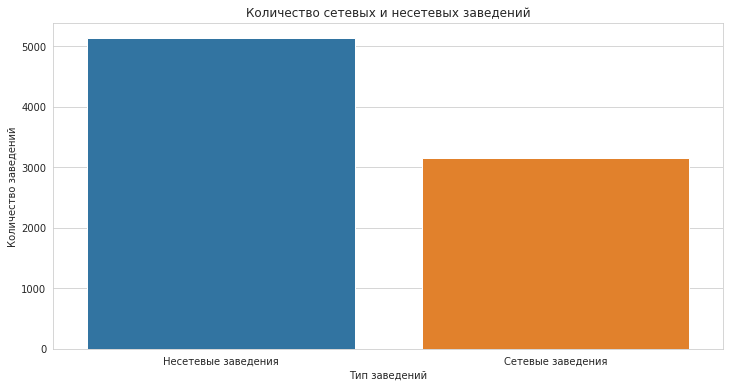

In [29]:
plt.figure(figsize=(12, 6))
ax1 = sns.barplot(x='type', y='chain', data=data_chain)
plt.xlabel('Тип заведений')
plt.ylabel('Количество заведений')
plt.title('Количество сетевых и несетевых заведений')
ax.set_xticklabels(ax.get_xticklabels(),rotation = 45)
plt.show()

Как видно выше, большая часть - **несетевые заведения**.

**3.4 Какие категории заведений чаще являются сетевыми?**

Ответим на этот вопрос с помощью гистограммы:

In [30]:
category_chain = data_clear.groupby(['category', 'chain']).agg({'name':'count'}).reset_index()
category_chain = category_chain.rename(columns={'name':'cnt'})
category_chain

,category,chain,cnt
0,"бар,паб",0,580
1,"бар,паб",1,167
2,булочная,0,99
3,булочная,1,155
4,быстрое питание,0,368
5,быстрое питание,1,231
6,кафе,0,1582
7,кафе,1,766
8,кофейня,0,685
9,кофейня,1,709


In [31]:
chain_0 = category_chain.loc[category_chain['chain']==0].sort_values(by='cnt', ascending=False)
chain_0

,category,chain,cnt
6,кафе,0,1582
12,ресторан,0,1291
8,кофейня,0,685
0,"бар,паб",0,580
4,быстрое питание,0,368
10,пиццерия,0,300
14,столовая,0,226
2,булочная,0,99


In [32]:
chain_1 = category_chain.loc[category_chain['chain']==1].sort_values(by='cnt', ascending=False)
chain_1

,category,chain,cnt
7,кафе,1,766
13,ресторан,1,713
9,кофейня,1,709
11,пиццерия,1,327
5,быстрое питание,1,231
1,"бар,паб",1,167
3,булочная,1,155
15,столовая,1,86


In [33]:
fig = go.Figure()

non_chain = go.Bar(x=chain_0['category'], y=chain_0['cnt'],
                marker=dict(color='green'),
                name='Несетевые заведения')
chain = go.Bar(x=chain_1['category'], y=chain_1['cnt'],
                marker=dict(color='red'),
                name='Сетевые заведения')
fig.update_layout(xaxis_title='Категория', yaxis_title='Количество заведений')
fig.update_xaxes(tickangle=45)
fig.layout.update({'title': 'Распределение сетевых и несетевых заведений в зависимости от типа'})
fig.add_traces([non_chain, chain])

Для всех категорий, кроме булочных, кофеен и пиццерий преобладают несетевые заведения. Сетевых булочных, кофеен и пиццерий немного больше, чем несетевых.

**3.5 Топ-15 популярных сетей.**

На этом этапе определим следующее:

- сколько заведений в каждой сети;
- сколько заведений в зависимости от категории;
- как распределены заведения по районам и категориям.

In [34]:
data_chain_name = data_clear.pivot_table(index=['name','category'], values='chain', aggfunc='sum').reset_index()
data_chain_name = data_chain_name.sort_values(by='chain', ascending=False)
data_chain_name_top = data_chain_name.head(15)
data_chain_name_top

,name,category,chain
5866,Шоколадница,кофейня,116
2712,Домино'с Пицца,пиццерия,76
2677,Додо Пицца,пиццерия,73
1190,One Price Coffee,кофейня,70
5942,Яндекс Лавка,ресторан,68
423,Cofix,кофейня,65
1335,Prime,ресторан,47
2970,КОФЕПОРТ,кофейня,42
3483,Кулинарная лавка братьев Караваевых,кафе,38
5073,Теремок,ресторан,36


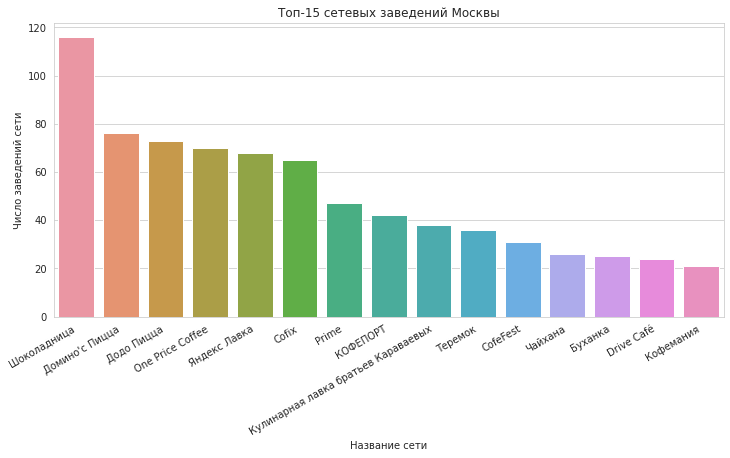

In [35]:
fig = plt.figure(figsize=(12, 6))
ax = sns.barplot(x='name', y='chain', data=data_chain_name_top)
plt.xlabel('Название сети')
plt.ylabel('Число заведений сети')
plt.title('Топ-15 сетевых заведений Москвы')
fig.autofmt_xdate()
plt.show()

Самой распространненной сетью в Москве (причем с заметным отрывом) является **"Шоколадница"**. В Топ-15 вошли сразу 6 кофеен. Заведения, вошедшие в Топ-15, в большинстве своем нацелены на быстрое обслуживание посетителей, имеют много возможностей для доставки и, как правило, занимают небольшие площади. 

In [36]:
data_chain_category = data_chain_name_top.pivot_table(index=['category'], values='chain', aggfunc='sum').reset_index()
data_chain_category = data_chain_category.sort_values(by='chain', ascending=False)
data_chain_category

,category,chain
2,кофейня,345
4,ресторан,151
3,пиццерия,149
1,кафе,88
0,булочная,25


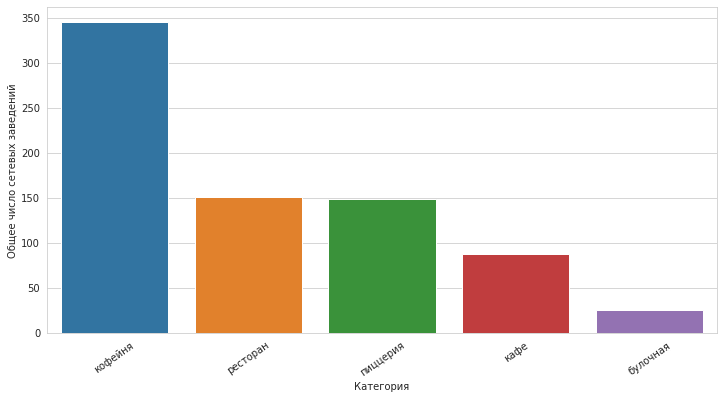

In [37]:
plt.figure(figsize=(12, 6))
ax = sns.barplot(x='category', y='chain', data=data_chain_category)
plt.xlabel('Категория')
plt.ylabel('Общее число сетевых заведений')
ax.set_xticklabels(ax.get_xticklabels(),rotation = 35)
plt.show()

Как видно выше кофейни - явные лидеры среди сетевых заведений из Топ-15. Осталось определить, как распределены типы сетевых заведений из Топ-15 по районам Москвы.

In [38]:
data_top15 = data_clear.loc[data_clear['name'].isin(data_chain_name_top['name'])&
                            data_clear['category'].isin(data_chain_name_top['category'])]

In [39]:
data_chain_district = data_top15.pivot_table(index='category', values='chain', columns='district', aggfunc='sum').reset_index()
data_chain_district.columns=['category','ВАО','ЗАО','САО','СВАО','СЗАО','ЦАО','ЮВАО','ЮЗАО','ЮАО']
data_chain_district

,category,ВАО,ЗАО,САО,СВАО,СЗАО,ЦАО,ЮВАО,ЮЗАО,ЮАО
0,булочная,1.0,5.0,8.0,6.0,3.0,1.0,NaN,1.0,NaN
1,кафе,2.0,13.0,8.0,5.0,1.0,37.0,11.0,9.0,6.0
2,кофейня,29.0,43.0,43.0,37.0,20.0,104.0,15.0,26.0,34.0
3,пиццерия,20.0,15.0,20.0,19.0,13.0,8.0,16.0,16.0,22.0
4,ресторан,15.0,14.0,12.0,14.0,5.0,49.0,11.0,16.0,24.0


In [40]:
fig = px.bar(data_chain_district, x=['ВАО','ЗАО','САО','СВАО','СЗАО','ЦАО','ЮВАО','ЮЗАО','ЮАО'], y='category',
             title='Распределение по районам и типам заведений из Топ-15')
fig.update_layout(xaxis_title='Количество заведений',
                  yaxis_title='Категории')
fig.update_layout(barmode='stack', yaxis={'categoryorder':'total ascending'})
fig.show()

Как видно из таблицы и рисунка, Центральный АО - лидер по числу кофеен, ресторанов и кафе, что в принципе логично - большинство людей работает в центре, либо приезжает в центр отдохнуть.

**3.6 Исследование по административным районам Москвы.**

На предыдущем шаге была представлена информация об административных округах Москвы (их всего 9):

* ВАО - Восточный административный округ;
* ЗАО - Западный административный округ;
* САО - Северный административный округ;
* СВАО - Северо-восточный административный округ;
* СЗАО - Северо-западный административный округ;
* ЦАО - Центральный административный округ;
* ЮВАО - Юго-восточный административный округ;
* ЮЗАО - Юго-западный административный округ;
* ЮАО - Южный административный округ.

Теперь изучим, как распределены заведения по административным округам:

In [41]:
data_district=data_clear.pivot_table(index='district', columns='category', values='name', aggfunc=['count']).reset_index(drop=True)
data_district['district']=['ВАО','ЗАО','САО','СВАО','СЗАО','ЦАО','ЮВАО','ЮЗАО','ЮАО']
data_district.columns = ['бар,паб', 'булочная', 'быстрое питание', 'кафе', 'кофейня', 'пиццерия', 'ресторан', 'столовая', 'district']
data_district

,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,district
0,48,25,70,269,104,72,160,40,ВАО
1,46,37,62,232,146,70,208,23,ЗАО
2,66,38,58,231,186,74,184,40,САО
3,63,28,82,266,159,68,182,40,СВАО
4,23,12,30,115,62,40,109,18,СЗАО
5,359,49,86,455,423,113,655,66,ЦАО
6,38,13,67,282,89,55,144,25,ЮВАО
7,38,27,61,236,95,64,166,17,ЮЗАО
8,66,25,83,262,130,71,196,43,ЮАО


In [42]:
fig = px.bar(data_district, x=['бар,паб', 'булочная', 'быстрое питание', 'кафе', 'кофейня', 'пиццерия', 'ресторан', 'столовая'], 
             y='district',
             title='Распределение по районам и типам заведений')
fig.update_xaxes(tickangle=45)
fig.update_layout(xaxis_title='Количество заведений',
                  yaxis_title='Округ')
fig.update_layout(barmode='stack', yaxis={'categoryorder':'total ascending'})
fig.show()

Согласно рисунку больше всего заведений находится в ЦАО - здесь больше всего ресторанов, кофеен, кафе и баров. Заведения остальных категорий распределены немного равномернее по всем округам. В СЗАО оказалось меньше всего заведений общепита. Это может быть связано с меньшим количеством людей в этом округе, либо с отсутсвием "мест притяжения", куда люди могли бы приезжать.

**3.7 Исследование средних рейтингов по категориям заведений.**

Посмотрим, как зависят оценки посетителей от типа заведения общепита:

In [43]:
data_rating = data_clear.pivot_table(index='category', values='rating', aggfunc='mean').reset_index()
data_rating['rating'] = round(data_rating['rating'],2)
data_rating = data_rating.sort_values(by='rating', ascending=False)
data_rating

,category,rating
0,"бар,паб",4.39
5,пиццерия,4.30
6,ресторан,4.29
4,кофейня,4.28
1,булочная,4.27
7,столовая,4.21
3,кафе,4.12
2,быстрое питание,4.05


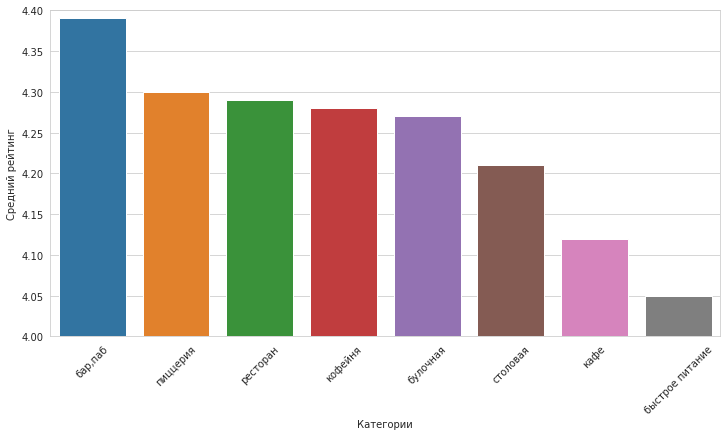

In [44]:
plt.figure(figsize=(12, 6))
ax = sns.barplot(x='category', y='rating', data=data_rating)
plt.xlabel('Категории')
plt.ylabel('Средний рейтинг')
plt.ylim(4,4.4)
ax.set_xticklabels(ax.get_xticklabels(),rotation = 45)
plt.show()

Самые высокие средние оценки среди заведений общепита имеют бары и пабы - **4.39**, а самые низкие - заведения быстрого питания (**4.05**). Пиццерии, рестораны, кофейни и булочные имеют очень близкие рейтинги - **от 4.27 до 4.30**.

**3.8 Построить фоновую картограмму (хороплет) со средним рейтингом заведений каждого района.**

Сначала определим средние рейтинги заведения каждого района:

In [45]:
district_rating = data_clear.groupby('district', as_index=False)['rating'].agg('mean')
district_rating['rating'] = round(district_rating['rating'],2)
district_rating

,district,rating
0,Восточный административный округ,4.17
1,Западный административный округ,4.18
2,Северный административный округ,4.24
3,Северо-Восточный административный округ,4.15
4,Северо-Западный административный округ,4.21
5,Центральный административный округ,4.38
6,Юго-Восточный административный округ,4.10
7,Юго-Западный административный округ,4.17
8,Южный административный округ,4.19


Для пострения хороплета воспользуемся файлом admin_level_geomap.geojson.

In [46]:
with open('/datasets/admin_level_geomap.geojson', 'r') as f:
    geo_json = json.load(f)

In [47]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=district_rating,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

Как видно по карте, в центре Москвы средний рейтинг заведений самый высокий - примерно **4.38**, а в ЮВАО - самый низкий (**4.10**).

**3.9 Отобразить все заведения на карте с помощью кластеров.**

Вновь обратимся к средствам библиотеки folium:

In [48]:
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data_clear.apply(create_clusters, axis=1)

# выводим карту
m

Все заведения общепита из нашего датасета отображены в кластерах.

**3.10 Топ-15 улиц по количеству заведений.**

Определим, как распределены заведения и их категории по этим улицам.

In [49]:
data_street = data_clear.groupby('street', as_index=False).agg('count')
data_street = data_street.sort_values(by='name', ascending=False)
data_street_top = data_street[['street','name']].head(15)
data_street_top.columns = ['street', 'total']
data_street_top

,street,total
1067,проспект Мира,184
782,Профсоюзная улица,122
538,Ленинский проспект,101
1064,проспект Вернадского,97
388,Дмитровское шоссе,88
470,Каширское шоссе,77
317,Варшавское шоссе,75
536,Ленинградский проспект,72
537,Ленинградское шоссе,69
557,Люблинская улица,60


Как видим, на проспекте Мира больше всего заведений общепита (что вполне логично, зная, что это одна из самых длинных и оживленных улиц Москвы). Теперь определим, как распределены заведения по категориям на этих улицах.

In [50]:
data_street_top15 = data_clear.loc[data_clear['street'].isin(data_street_top['street'])]
data_street_top15.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
8,Donna Maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,NaN,0,79.0,Дмитровское шоссе,False
17,Чайхана Беш-Бармак,ресторан,"Москва, Ленинградское шоссе, 71Б, стр. 2",Северный административный округ,"ежедневно, круглосуточно",55.876908,37.449876,4.4,средние,Средний счёт:350–500 ₽,425.0,NaN,0,96.0,Ленинградское шоссе,True
26,Пикочино,пиццерия,"Москва, Дмитровское шоссе, 107к2",Северный административный округ,"пн-чт 11:00–22:00; пт,сб 11:00–23:00; вс 11:00...",55.879390,37.541228,4.5,средние,Средний счёт:300–1500 ₽,900.0,NaN,0,NaN,Дмитровское шоссе,False
29,Кушай Город,столовая,"Москва, Дмитровское шоссе, 157, стр. 15",Северный административный округ,пн-пт 09:00–16:00,55.898414,37.539256,4.2,средние,Средний счёт:200–250 ₽,225.0,NaN,1,NaN,Дмитровское шоссе,False
43,Суши & пицца,ресторан,"Москва, Дмитровское шоссе, 169, корп. 6",Северо-Восточный административный округ,"ежедневно, 10:00–23:00",55.928943,37.540548,4.0,NaN,NaN,NaN,NaN,0,NaN,Дмитровское шоссе,False


In [51]:
data_street_category = data_street_top15.pivot_table(index='street', values='name', columns='category', aggfunc='count').reset_index()
data_street_category = data_street_category.merge(data_street_top, left_on='street', right_on='street').sort_values(by='total', ascending=False)
data_street_category

,street,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,total
12,проспект Мира,12.0,4.0,21.0,53.0,36.0,11.0,45.0,2.0,184
9,Профсоюзная улица,6.0,4.0,15.0,35.0,18.0,15.0,26.0,3.0,122
7,Ленинский проспект,10.0,3.0,2.0,25.0,23.0,5.0,28.0,5.0,101
11,проспект Вернадского,5.0,1.0,12.0,23.0,14.0,11.0,29.0,2.0,97
2,Дмитровское шоссе,6.0,2.0,10.0,23.0,11.0,8.0,24.0,4.0,88
3,Каширское шоссе,2.0,NaN,10.0,20.0,16.0,5.0,19.0,5.0,77
1,Варшавское шоссе,6.0,NaN,7.0,17.0,14.0,4.0,20.0,7.0,75
5,Ленинградский проспект,13.0,3.0,2.0,8.0,18.0,6.0,20.0,2.0,72
6,Ленинградское шоссе,5.0,2.0,5.0,13.0,13.0,3.0,25.0,3.0,69
8,Люблинская улица,5.0,NaN,5.0,26.0,11.0,1.0,10.0,2.0,60


In [52]:
fig = px.bar(data_street_category, x='street',
             y=['бар,паб', 'булочная', 'быстрое питание', 'кафе', 'кофейня', 'пиццерия', 'ресторан', 'столовая'],
             title='Распределение по улицам и типам заведений')
fig.update_xaxes(tickangle=45)
fig.update_layout(xaxis_title='Улица',
                  yaxis_title='Количество заведений')
fig.show()

Как видно по рисунку, проспект Мира является лидером по числу ресторанов, кофеен, кафе и предприятий быстрого питания.

**3.11 Исследование улиц с единственным объектом общепита.**

А теперь изучим улицы, на которых находится только один объект общепита.

In [53]:
data_street_low = data_clear.groupby('street', as_index=False).agg('count')
data_street_low = data_street_low.sort_values(by='name')
data_street_low = data_street_low[['street','name']]
data_street_low.columns = ['street', 'total']
data_street_low = data_street_low.loc[data_street_low['total']==1]
data_street_low

,street,total
0,1-й Автозаводский проезд,1
657,Новая улица,1
658,Новгородская улица,1
669,Новолучанская улица,1
671,Новомосковская улица,1
...,...,...
289,Большой Строченовский переулок,1
277,Большой Кисловский переулок,1
310,Булатниковский проезд,1
302,Ботанический переулок,1


В Москве есть 440 улиц с единственным объектом общепита. Это может означать следующее:
* сами улицы небольшие, и поэтому размещение большого числа заведений здесь нецелесообразно;
* единственное заведение качественно справляется с потоком посетителей, что не дает конкурентам легко войти на эту территорию.

Вытащим из таблицы "data_clear" строки с улицами с единственным заведением общепита:

In [54]:
data_low = data_clear.loc[data_clear['street'].isin(data_street_low['street'])]
data_low.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 440 entries, 12 to 8279
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               440 non-null    object 
 1   category           440 non-null    object 
 2   address            440 non-null    object 
 3   district           440 non-null    object 
 4   hours              414 non-null    object 
 5   lat                440 non-null    float64
 6   lng                440 non-null    float64
 7   rating             440 non-null    float64
 8   price              179 non-null    object 
 9   avg_bill           190 non-null    object 
 10  middle_avg_bill    161 non-null    float64
 11  middle_coffee_cup  24 non-null     float64
 12  chain              440 non-null    int64  
 13  seats              157 non-null    float64
 14  street             440 non-null    object 
 15  is_24/7            440 non-null    object 
dtypes: float64(6), int64(1),

Посмотрим на карте, как они распределены:

In [55]:
m_low = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

marker_cluster = MarkerCluster().add_to(m_low)

def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

data_low.apply(create_clusters, axis=1)

m_low

Что сразу обращает на себя внимание - улицы с единственным заведением общепита находятся либо не в самых доступных местах (промзоны, либо в глубине района), либо сами по себе короткие.

Посмотрим на средний чек в этих заведениях:

In [56]:
category_avg_bill_low = data_low.groupby('category', as_index=False)['middle_avg_bill'].agg('mean').sort_values(by='middle_avg_bill', ascending=False)
category_avg_bill_low['middle_avg_bill'] = round(category_avg_bill_low['middle_avg_bill'],0)
category_avg_bill_low

,category,middle_avg_bill
6,ресторан,1689.0
0,"бар,паб",1400.0
5,пиццерия,786.0
2,быстрое питание,758.0
3,кафе,641.0
4,кофейня,582.0
7,столовая,282.0
1,булочная,NaN


In [57]:
district_avg_bill_low = data_low.groupby('district', as_index=False)['middle_avg_bill'].agg('mean').sort_values(by='middle_avg_bill', ascending=False)
district_avg_bill_low['middle_avg_bill'] = round(district_avg_bill_low['middle_avg_bill'],0)
district_avg_bill_low

,district,middle_avg_bill
4,Северо-Западный административный округ,1434.0
5,Центральный административный округ,1338.0
6,Юго-Восточный административный округ,1111.0
3,Северо-Восточный административный округ,713.0
2,Северный административный округ,696.0
1,Западный административный округ,692.0
8,Южный административный округ,683.0
0,Восточный административный округ,614.0
7,Юго-Западный административный округ,394.0


In [58]:

m1_low = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=state_geo,
    data=district_avg_bill_low,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний чек по районам',
).add_to(m1_low)

m1_low

In [59]:
district_avg_bill = data_clear.groupby('district', as_index=False)['middle_avg_bill'].agg('mean').sort_values(by='middle_avg_bill', ascending=False)
district_avg_bill['middle_avg_bill'] = round(district_avg_bill['middle_avg_bill'],0)
compare = district_avg_bill.merge(district_avg_bill_low, left_on='district', right_on='district')
compare.columns = ['district', 'avg_total', 'avg_low']
compare

,district,avg_total,avg_low
0,Центральный административный округ,1192.0,1338.0
1,Западный административный округ,1039.0,692.0
2,Северный административный округ,924.0,696.0
3,Южный административный округ,831.0,683.0
4,Северо-Западный административный округ,822.0,1434.0
5,Восточный административный округ,812.0,614.0
6,Юго-Западный административный округ,793.0,394.0
7,Северо-Восточный административный округ,717.0,713.0
8,Юго-Восточный административный округ,651.0,1111.0


Средний чек на этих улицах заметно отличается от среднего чека по соответствующему району (исключение - СВАО, здесь средние чеки практически равны).

**3.12 Исследование средних чеков заведений по районам.**

Посмотрим, как зависит величина среднего чека от расположения заведения общепита.

In [60]:
district_avg_bill = data_clear.groupby('district', as_index=False)['middle_avg_bill'].agg('mean').sort_values(by='middle_avg_bill', ascending=False)
district_avg_bill['middle_avg_bill'] = round(district_avg_bill['middle_avg_bill'],0)
district_avg_bill

,district,middle_avg_bill
5,Центральный административный округ,1192.0
1,Западный административный округ,1039.0
2,Северный административный округ,924.0
8,Южный административный округ,831.0
4,Северо-Западный административный округ,822.0
0,Восточный административный округ,812.0
7,Юго-Западный административный округ,793.0
3,Северо-Восточный административный округ,717.0
6,Юго-Восточный административный округ,651.0


In [61]:
# создаём карту Москвы
m1 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=district_avg_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний чек по районам',
).add_to(m1)

# выводим карту
m1

По карте видно, что средний чек самый большой в ЦАО (**1192 рубля**), а минимальный в ЮВАО (**651**). Заметно, что в западном направлении от центра средний чек несколько выше, чем на востоке Москвы. И в целом, при удалении от центра видна тенденция уменьшения среднего чека.

**3.13 Вывод по шагу 3.**

На данном шаге был проведен исследовательский анализ датасета, по результатам которого было получено следующее:
1. Основную долю заведений составляют кафе и рестораны, кофейни третьи по популярности. Меньше всего столовых и булочных.
2. Наибольшее количество посадочных мест в ресторанах (в том числе и среднее количество). В кафе общее число посадочных мест  на втором по порядку месте, но при этом среднее количество посадочных мест минимальное. В кофейнях общее число посадочных мест уступает только ресторанам и кафе, а среднее число опережает только кафе, столовые и булочные.
3. Большая часть заведений **несетевые**.
4. Для всех категорий, кроме кофеен и пиццерий преобладают несетевые заведения. Сетевых кофеен и пиццерий немного больше, чем несетевых.
5. Самой распространненной сетью в Москве (причем с заметным отрывом) является "Шоколадница". Кофейни - явные лидеры среди сетевых заведений из Топ-15. Центральный АО - лидер по числу кофеен, ресторанов и кафе, что в принципе логично - большинство людей работает в центре, либо приезжает в центр отдохнуть.
6. Больше всего заведений находится в ЦАО - здесь больше всего ресторанов, кофеен, кафе и баров. Заведения остальных категорий распределены немного равномернее по всем округам. В СЗАО оказалось меньше всего заведений общепита.
7. Самые высокие средние оценки среди заведений общепита имеют бары и пабы, а самые низкие - заведения быстрого питания. Пиццерии, рестораны, кофейни и булочные имеют очень близкие рейтинги.
8. В центре Москвы средний рейтинг заведений самый высокий, а в ЮВАО - самый низкий.
9. Проспект Мира является лидером по числу  заведений общепита, и в частности ресторанов, кофеен, кафе и предприятий быстрого питания.
10. В Москве 440 улиц с единственным объектом общепита.
11. Средний чек самый большой в ЦАО, а минимальный в ЮВАО. При удалении от центра видна тенденция уменьшения среднего чека.

## Детализация исследования

Поскольку заказчику захотелось открыть кофейню, на данном шаге исследуем следующее:

1. Сколько кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?
2. Есть ли среди кофеен круглосуточные?
3. Какие рейтинги у кофеен и как они распределены по районам?
4. На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?

**4.1 Сколько кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?**

In [62]:
data_coffee = data_clear.loc[data_clear['category']=='кофейня']
total_coffee = len(data_coffee)
print('В датасете всего', total_coffee, 'кофейни.')

В датасете всего 1394 кофейни.


Посмотрим, как кофейни распределены по районам:

In [63]:
data_coffee_district = data_coffee.groupby('district', as_index=False)['name'].agg('count').sort_values(by='name', ascending=False)
data_coffee_district.columns = ['district', 'cnt']
data_coffee_district

,district,cnt
5,Центральный административный округ,423
2,Северный административный округ,186
3,Северо-Восточный административный округ,159
1,Западный административный округ,146
8,Южный административный округ,130
0,Восточный административный округ,104
7,Юго-Западный административный округ,95
6,Юго-Восточный административный округ,89
4,Северо-Западный административный округ,62


In [64]:
# создаём карту Москвы
m2 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=data_coffee_district,
    columns=['district', 'cnt'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Число кофеен по районам',
).add_to(m2)

# выводим карту
m2

И из таблицы, и по карте видно, что кофейни в гораздо большем количестве располагаются в Центральном АО. Чем дальше мы будем находиться от центра, тем меньше кофеен окажется поблизости.

**4.2 Есть ли круглосуточные кофейни?**

In [65]:
data_coffee_allday = data_coffee.loc[data_coffee['is_24/7']==True]
len(data_coffee_allday)

59

В Москве 59 круглосуточных кофеен. Посмотрим, где они располагаются.

In [66]:
data_coffee_district_allday = data_coffee_allday.groupby('district', as_index=False)['name'].agg('count')
data_coffee_district_allday.columns = ['district', 'cnt']
data_coffee_district_allday['district'] = ['ВАО','ЗАО','САО','СВАО','СЗАО','ЦАО','ЮВАО','ЮЗАО','ЮАО']
data_coffee_district_allday = data_coffee_district_allday.sort_values(by='cnt', ascending=False)
data_coffee_district_allday

,district,cnt
5,ЦАО,26
1,ЗАО,9
7,ЮЗАО,7
0,ВАО,5
2,САО,5
3,СВАО,3
4,СЗАО,2
6,ЮВАО,1
8,ЮАО,1


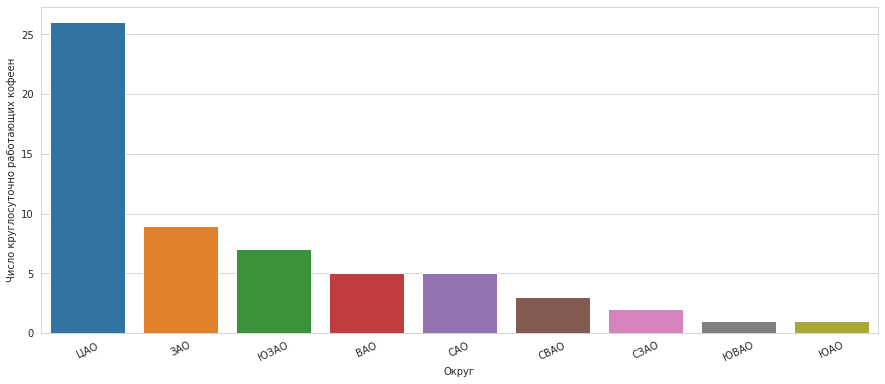

In [67]:
plt.figure(figsize=(15,6))
ax = sns.barplot(x='district', y='cnt', data=data_coffee_district_allday)
plt.xlabel('Округ')
plt.ylabel('Число круглосуточно работающих кофеен')
ax.set_xticklabels(ax.get_xticklabels(),rotation = 25)
plt.show()

Как в целом и по всему исследованию, число круглосуточно работающих кофеен в ЦАО заметно превышает аналогичное в других административных округах.

**4.3 Какие рейтинги у кофеен и как они распределены по районам?**

In [68]:
data_coffee_rating = data_coffee.groupby('district', as_index=False)['rating'].agg('mean')
data_coffee_rating.columns = ['district', 'mean_rating']
data_coffee_rating['mean_rating'] = round(data_coffee_rating['mean_rating'],2)
data_coffee_rating['district'] = ['ВАО','ЗАО','САО','СВАО','СЗАО','ЦАО','ЮВАО','ЮЗАО','ЮАО']
data_coffee_rating = data_coffee_rating.sort_values(by='mean_rating', ascending=False)
data_coffee_rating

,district,mean_rating
5,ЦАО,4.34
4,СЗАО,4.33
2,САО,4.29
7,ЮЗАО,4.29
0,ВАО,4.28
6,ЮВАО,4.23
8,ЮАО,4.23
3,СВАО,4.22
1,ЗАО,4.19


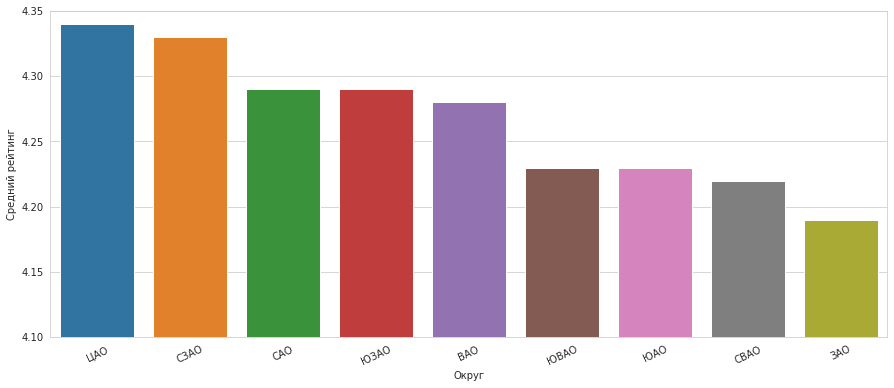

In [69]:
plt.figure(figsize=(15,6))
ax = sns.barplot(x='district', y='mean_rating', data=data_coffee_rating)
plt.xlabel('Округ')
plt.ylabel('Средний рейтинг')
plt.ylim(4.1,4.35)
ax.set_xticklabels(ax.get_xticklabels(),rotation = 25)
plt.show()

Как видно по рисунку, самый высокий средний рейтинг у кофеен в ЦАО, немного ниже в СЗАО, а в ЗАО - самый низкий.

**4.4 На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?**

Исследуем, чему равна средняя стоимость чашки капучино в каждом округе.

In [70]:
data_cup = data_coffee.groupby('district', as_index=False)['middle_coffee_cup'].agg('mean')
data_cup.columns = ['district', 'mean_cup']
data_cup['district'] = ['ВАО','ЗАО','САО','СВАО','СЗАО','ЦАО','ЮВАО','ЮЗАО','ЮАО']
data_cup = data_cup.sort_values(by='mean_cup', ascending=False)
data_cup

,district,mean_cup
1,ЗАО,188.562500
5,ЦАО,188.000000
7,ЮЗАО,184.176471
0,ВАО,174.023810
2,САО,166.338028
4,СЗАО,165.523810
3,СВАО,165.333333
8,ЮАО,158.488372
6,ЮВАО,151.088235


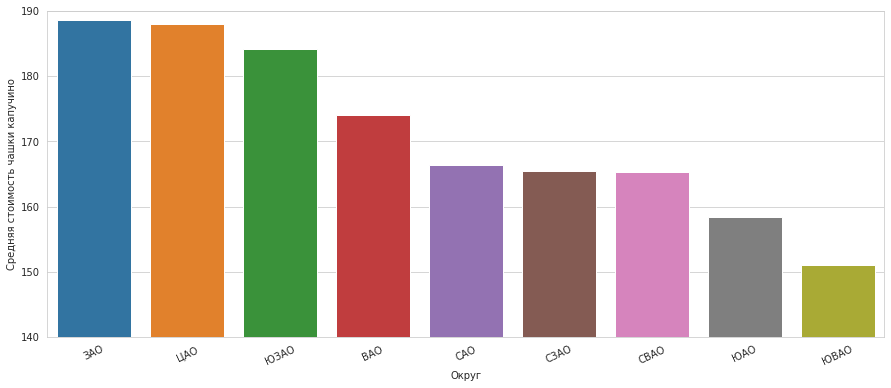

In [71]:
plt.figure(figsize=(15,6))
ax = sns.barplot(x='district', y='mean_cup', data=data_cup)
plt.xlabel('Округ')
plt.ylabel('Средняя стоимость чашки капучино')
plt.ylim(140,190)
ax.set_xticklabels(ax.get_xticklabels(),rotation = 25)
plt.show()

Оказалось, что в среднем самый дорогой кофе подают в Западном АО (**188.56 рублей**). В ЦАО совсем немного дешевле (**188 рублей**), а в ЮВАО - заметно самый дешевый кофе (**151.09 рублей**). 

При открытии кофейни в определенном районе Москвы, нужно ориентироваться на среднюю стоимость чашки кофе в данном районе (причем на начальном этапе стоит поставить цену немного ниже средней, либо организовать стимулирующую промо-акцию), поскольку клиенты, которые посещают кофейни вряд ли просто так откажутся от посещения "старой" кофейни в пользу "новой".

**4.5 Рекомендации для открытия нового заведения.**

По итогам детализированного исследования на предмет открытия кофейни рекомендации следующие:

1. В ЦАО заметно большее количество кофеен, чем во всех остальных округах Москвы, поэтому здесь будет слишком большая конкуренция, и есть повышенный риск неудачного открытия новой кофейни. Таким образом, лучше сосредоточиться на открытии кофейни в округе с меньшим количеством конкурентов, например, в **САО**.
2. Расположение кофейни в САО надо выбрать таким, чтобы можно было рассчитывать на постоянный поток посетителей. В этом плане стоит рассмотреть помещения на **Ленинградском проспекте** (здесь 18 кофеен, но улица очень длинная). 
3. В **САО** 186 кофеен, из которых всего 5 круглосуточных. На первых этапах работы можно попробовать также стать круглосуточной кофейней.
4. Средний рейтинг кофеен в САО - **4.28**, что в принципе является достаточно высокой оценкой. Поэтому при открытии нужно обязательно позаботиться о том, чтобы у посетителей в первые дни сформировалось положительное отношение к предприятию. Этого можно добиться благодаря:
    * оригинальному оформлению заведения;
    * хорошо обученному персоналу;
    * грамотно подобранному ассортименту (кроме самых популярных видов кофе, можно предлагать какой-нибудь фирменный напиток).
    
    
5. Средняя стоимость чашки кофе в САО примерно **166 рублей**. При открытии можно организовать либо промо-акцию, либо поставить стоимость чашки кофе немного ниже средней. Это даст возможность "переманить" посетителей от конкурентов.

## Презентация и общий вывод

После изучения датасета и его предобработки было проведено исследование рынка общепита Москвы. По его результатам сделаны следующие выводы:

1. Основную долю заведений составляют кафе и рестораны; кофейни третьи по популярности.
2. Наибольшее количество посадочных мест в ресторанах, кафе - на втором месте, кофейни - на третьем.
3. В основном заведения несетевые.
4. ЦАО - лидер по числу заведений общепита, а также по среднему рейтингу заведений и среднему чеку.
5. У баров и пабов самые высокие средние оценки среди всех заведений общепита.
6. Проспект Мира - лидер среди улиц Москвы по количеству заведений общепита.

Поскольку инвесторы заинтересованы в открытии кофейни, то для них были сформулированы рекомендации:

1. Открыть кофейню в **САО** на **Ленинградском проспекте**.
2. На первых этапах работы рассмотреть возможность круглосуточной работы.
3. Оригинально оформить заведение, обучить персонал, подготовить ассортимент.
4. Ориентироваться на среднюю цену чашки кофе по округу.

Ниже выложена подготовленная презентация для инвесторов:

https://disk.yandex.ru/i/9KuNBjbAIJ_ljA.